# VRL Lap Plots
Plot lap trajectories onto the mountain track

In [1]:
## Imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import seaborn as sns
import os

from PIL import Image, ImageOps
from IPython.display import HTML

## Data
### Constants/Parameters

In [2]:
## Directories
data_directory = f'../data'

# Total mountain track image size
TRACK_IMAGE_HEIGHT = 634
TRACK_IMAGE_WIDTH = 653

# Size of box enclosing action track boundaries
TRACK_MAP_HEIGHT = 599
TRACK_MAP_WIDTH = 624

# Pandas dataframe with lap data. use whatever format
# you want, just change read_pickle to match
laps_file = f'{data_directory}/01_26_2022/12_14_54/processed_laps.pkl'

# Full color track image, outline image
track_image_file = '../assets/images/mountain_track_map.png'
track_outline_file = '../assets/images/mountain_track_outline.png'

### Load Lap Data

In [3]:
df_boundaries = pd.read_pickle('../assets/mountain_boundary_laps.pkl')

In [4]:
df = pd.read_pickle(laps_file)
# df = df.sort_values(by=['folder_lap', 'time'])
df.head()

,steering,throttle,speed,image,hit,time,accel_x,accel_y,accel_z,gyro_x,...,pos_z,vel_x,vel_y,vel_z,lap,folder,folder_lap,lap_time,lap_type,first_lap
0,-0.060416,0.974172,6.972424,8671.633.PNG,none,8671.632812,11.568150,11.872450,20.711330,-0.000676,...,48.543430,0.071649,-0.224815,6.968430,1,01_25_2022/20_44_01,01_25_2022/20_44_01_1,19.700195,first,1
1,-0.052002,0.975089,7.331753,8671.683.PNG,none,8671.682617,0.055814,3.764422,6.731701,0.000578,...,48.184269,-0.044126,0.088742,7.331083,1,01_25_2022/20_44_01,01_25_2022/20_44_01_1,19.700195,first,1
2,-0.052002,0.975089,7.700217,8671.732.PNG,none,8671.732422,0.056496,-0.866763,7.654762,0.000830,...,47.809170,-0.041223,0.106288,7.699373,1,01_25_2022/20_44_01,01_25_2022/20_44_01_1,19.700195,first,1
3,-0.097384,0.977064,8.092502,8671.783.PNG,none,8671.783203,-0.430396,-1.993173,8.114624,0.000988,...,47.415352,-0.043860,0.015753,8.092367,1,01_25_2022/20_44_01,01_25_2022/20_44_01_1,19.700195,first,1
4,-0.097384,0.977064,8.493408,8671.833.PNG,none,8671.833008,0.113988,-37.309860,6.215096,0.004110,...,47.003330,-0.050067,-0.435518,8.482087,1,01_25_2022/20_44_01,01_25_2022/20_44_01_1,19.700195,first,1


## Plots

In [5]:
df = pd.concat([df, df_boundaries])
df

,steering,throttle,speed,image,hit,time,accel_x,accel_y,accel_z,gyro_x,...,pos_z,vel_x,vel_y,vel_z,lap,folder,folder_lap,lap_time,lap_type,first_lap
0,-0.060416,0.974172,6.972424,8671.633.PNG,none,8671.632812,11.568150,11.872450,20.711330,-6.758840e-04,...,48.543430,0.071649,-0.224815,6.968430,1,01_25_2022/20_44_01,01_25_2022/20_44_01_1,19.700195,first,1.0
1,-0.052002,0.975089,7.331753,8671.683.PNG,none,8671.682617,0.055814,3.764422,6.731701,5.777936e-04,...,48.184269,-0.044126,0.088742,7.331083,1,01_25_2022/20_44_01,01_25_2022/20_44_01_1,19.700195,first,1.0
2,-0.052002,0.975089,7.700217,8671.732.PNG,none,8671.732422,0.056496,-0.866763,7.654762,8.301812e-04,...,47.809170,-0.041223,0.106288,7.699373,1,01_25_2022/20_44_01,01_25_2022/20_44_01_1,19.700195,first,1.0
3,-0.097384,0.977064,8.092502,8671.783.PNG,none,8671.783203,-0.430396,-1.993173,8.114624,9.883892e-04,...,47.415352,-0.043860,0.015753,8.092367,1,01_25_2022/20_44_01,01_25_2022/20_44_01_1,19.700195,first,1.0
4,-0.097384,0.977064,8.493408,8671.833.PNG,none,8671.833008,0.113988,-37.309860,6.215096,4.110467e-03,...,47.003330,-0.050067,-0.435518,8.482087,1,01_25_2022/20_44_01,01_25_2022/20_44_01_1,19.700195,first,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5973,0.072343,0.000000,0.985289,307.2395.png,none,307.239502,-0.002707,-0.000423,-0.245851,1.730644e-07,...,35.001228,0.011169,0.000132,0.985226,5,NaN,NaN,NaN,NaN,NaN
5974,0.072343,0.000000,0.973072,307.2895.png,none,307.289490,-0.002583,-0.001507,-0.243354,2.441881e-07,...,34.952339,0.011041,0.000091,0.973009,5,NaN,NaN,NaN,NaN,NaN
5975,0.072343,0.000000,0.960977,307.3395.png,none,307.339508,-0.002542,0.002421,-0.240916,1.437447e-07,...,34.904049,0.010914,0.000134,0.960915,5,NaN,NaN,NaN,NaN,NaN
5976,0.072343,0.000000,0.949005,307.3895.png,none,307.389496,-0.002632,0.000211,-0.238520,9.193786e-08,...,34.856369,0.010786,0.000131,0.948944,5,NaN,NaN,NaN,NaN,NaN


### Calibrate Placement

Tweak the offset and scale of trajectories to place the plots where they should be on the map.

I have recorded laps that trace the outlines of the walls (more or less). I add them to the lap data, use them to line up the boundaries, then remove them. This is overboard, probably, I know, but it worked for me so here it is.

In [6]:
x_shift = 18
y_shift = 20
x_offset = df['pos_x'].min()
y_offset = df['pos_z'].min()
track_scale = 4.275

In [7]:
x = ((df['pos_x'].copy() - x_offset) * track_scale) + x_shift
y = ((df['pos_z'].copy() - y_offset) * track_scale) + y_shift

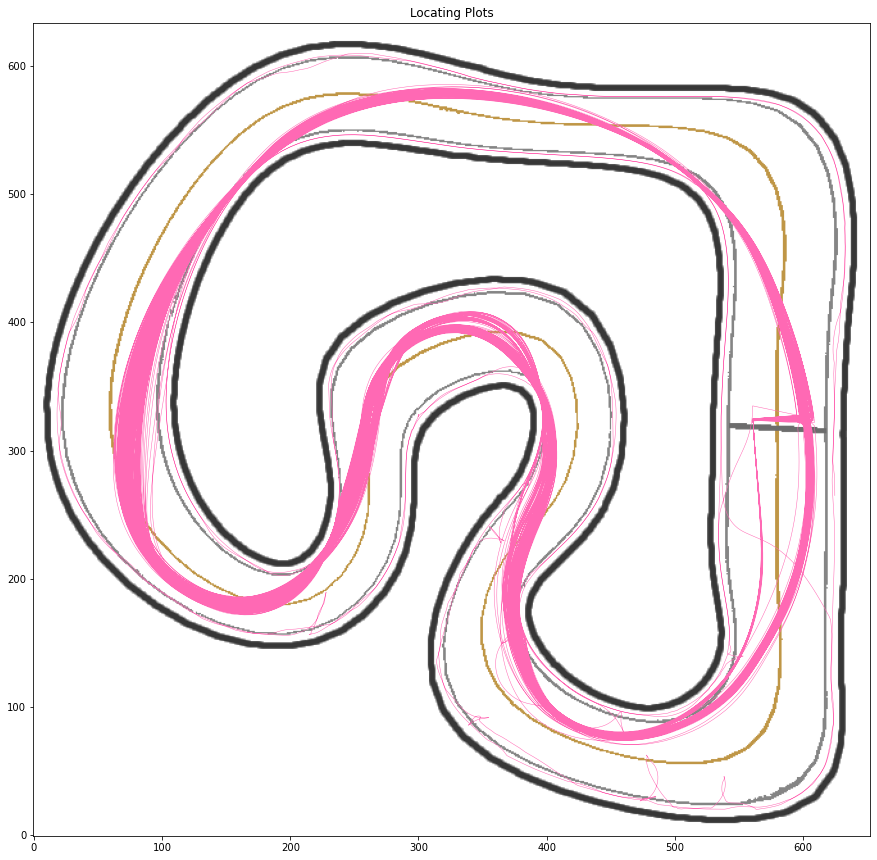

In [8]:
fig, ax = plt.subplots(figsize=(15,15))
plt.title('Locating Plots')
img = Image.open(track_outline_file)#copy()
img = img.transpose(method=Image.FLIP_TOP_BOTTOM)
ax.imshow(img)
ax.invert_yaxis()
ax.plot(x, y, linewidth=0.5, color='hotpink' );

In [9]:
## Get rid of the outline laps once you've got it lined up (ish)
df = pd.read_pickle(laps_file)

In [10]:
max_lap_time = round(df['lap_time'].max(), 3) # this is for plot titles only
fast_lap_cutoff = 18.15 # this actually decides what is plotted

### Create Plot Data

Separate different lap speeds to plot with arbitrary cutoff for "fast" laps.

Also grab fastest lap.

In [11]:
x = ((df['pos_x'].copy() - x_offset) * track_scale) + x_shift
y = ((df['pos_z'].copy() - y_offset) * track_scale) + y_shift

df_fast = df.loc[df['lap_time'] < fast_lap_cutoff, :]
x_fast = ((df_fast['pos_x'].copy() - x_offset) * track_scale) + x_shift
y_fast = ((df_fast['pos_z'].copy() - y_offset) * track_scale) + y_shift

fastest_time = df['lap_time'].min()
df_fastest = df.loc[df['lap_time'] == fastest_time, :]
x_fastest = ((df_fastest['pos_x'].copy() - x_offset) * track_scale) + x_shift
y_fastest = ((df_fastest['pos_z'].copy() - y_offset) * track_scale) + y_shift

### All Laps

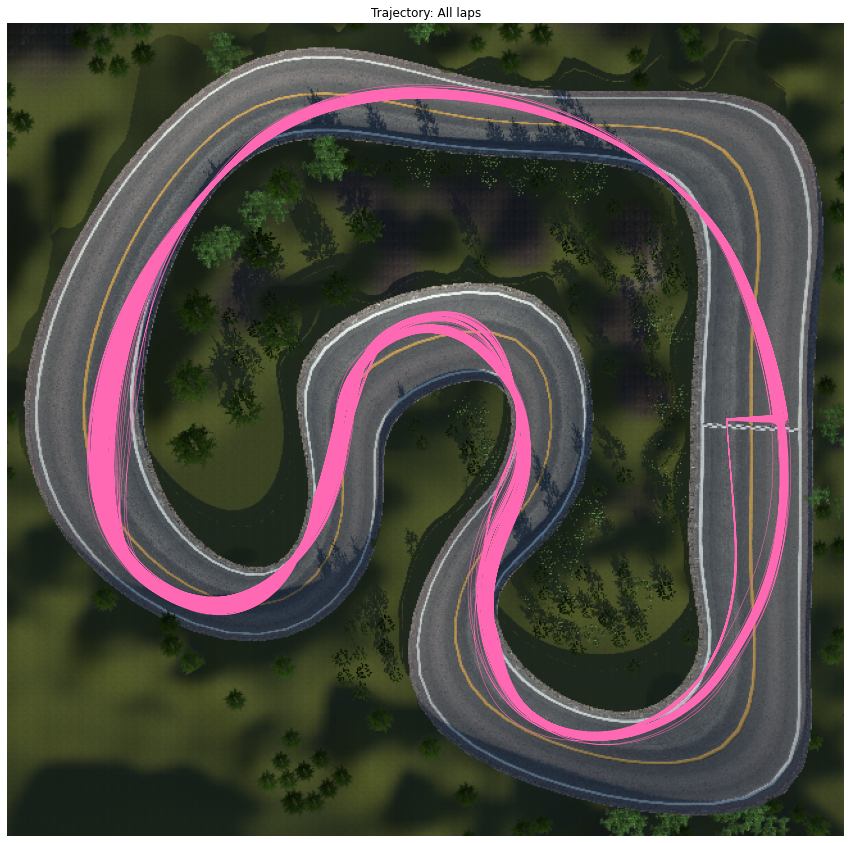

In [12]:
fig, ax = plt.subplots(figsize=(15,15))
img = Image.open(track_image_file)#copy()
img = img.transpose(method=Image.FLIP_TOP_BOTTOM)
plt.title('Trajectory: All laps')
plt.axis('off')
ax.imshow(img)
ax.invert_yaxis()
ax.plot(x, y, linewidth=0.5, color='hotpink' );

### Fast Laps

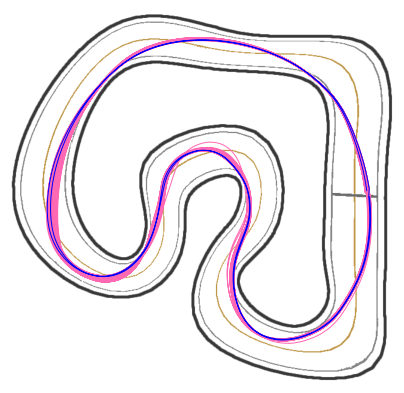

In [13]:
fig, ax = plt.subplots(figsize=(7,7))
img = Image.open(track_outline_file)#copy()
img = img.transpose(method=Image.FLIP_TOP_BOTTOM)
ax.imshow(img)
plt.axis('off')
ax.invert_yaxis()
ax.plot(x_fast, y_fast, linewidth=1.0, color='hotpink' );
ax.plot(x_fastest, y_fastest, linewidth=1.0, color='blue' );
# plt.tight_layout();

In [14]:
# df_fast['folder_lap'].unique()

In [15]:
len(df_fast)

37047

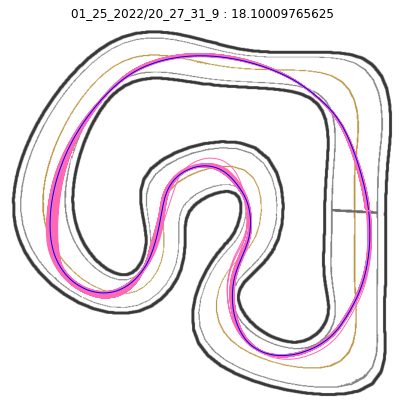

In [16]:
# '01_14_2022/13_00_37_177'
i = 3

fl = df_fast['folder_lap'].unique()[i]
temp_df = df.loc[df['folder_lap'] == fl, :] # wide in turn 1
temp_x = ((temp_df['pos_x'].copy() - x_offset) * track_scale) + x_shift
temp_y = ((temp_df['pos_z'].copy() - y_offset) * track_scale) + y_shift

fig, ax = plt.subplots(figsize=(7,7))
img = Image.open(track_outline_file)#copy()
img = img.transpose(method=Image.FLIP_TOP_BOTTOM)
ax.imshow(img)
plt.axis('off')
ax.invert_yaxis()
ax.plot(x_fast, y_fast, linewidth=1.0, color='hotpink' );
ax.plot(temp_x, temp_y, linewidth=1.0, color='blue' );
plt.title(f"{fl} : {temp_df['lap_time'].unique()[0]}");
# plt.tight_layout();

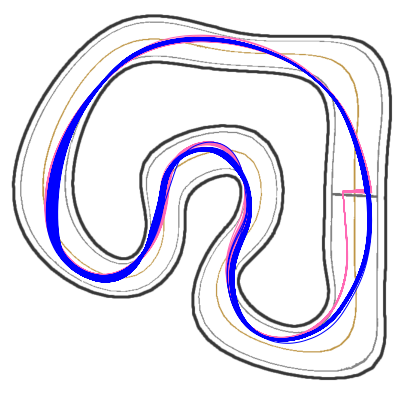

In [17]:
# i = 6
# fl = df_fast[''].unique()[i]
temp_df = df.loc[(df['lap_type'] == 'first') & (df['lap_time'] < 20.1), :] # wide in turn 1
temp_df = df.loc[(df['lap_type'] == 'first') & (df['lap_time'] < 20.1), :] # wide in turn 1

temp_x = ((temp_df['pos_x'].copy() - x_offset) * track_scale) + x_shift
temp_y = ((temp_df['pos_z'].copy() - y_offset) * track_scale) + y_shift

fig, ax = plt.subplots(figsize=(7,7))
img = Image.open(track_outline_file)#copy()
img = img.transpose(method=Image.FLIP_TOP_BOTTOM)
ax.imshow(img)
plt.axis('off')
ax.invert_yaxis()
ax.plot(temp_x, temp_y, linewidth=1.0, color='hotpink' );
ax.plot(x_fast, y_fast, linewidth=1.0, color='blue' );
# plt.title(f"{fl} : {temp_df['lap_time'].unique()[0]}");
# plt.tight_layout();

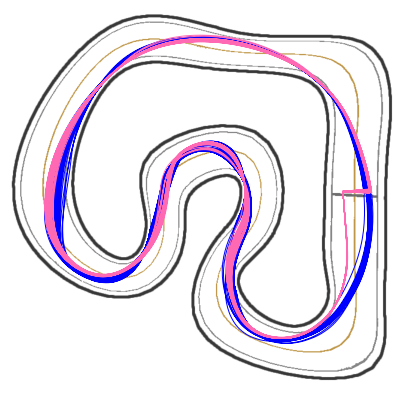

In [18]:
# i = 6
# fl = df_fast[''].unique()[i]
df_first = df.loc[df['first_lap'] == True, :] # wide in turn 1
x_first = ((df_first['pos_x'].copy() - x_offset) * track_scale) + x_shift
y_first = ((df_first['pos_z'].copy() - y_offset) * track_scale) + y_shift

df_later = df.loc[df['first_lap'] == False, :] # wide in turn 1
x_later = ((df_later['pos_x'].copy() - x_offset) * track_scale) + x_shift
y_later = ((df_later['pos_z'].copy() - y_offset) * track_scale) + y_shift

fig, ax = plt.subplots(figsize=(7,7))
img = Image.open(track_outline_file)#copy()
img = img.transpose(method=Image.FLIP_TOP_BOTTOM)
ax.imshow(img)
plt.axis('off')
ax.invert_yaxis()
ax.plot(x_later, y_later, linewidth=1.0, color='blue' );

ax.plot(x_first, y_first, linewidth=1.0, color='hotpink' );
# plt.title(f"{fl} : {temp_df['lap_time'].unique()[0]}");
# plt.tight_layout();

In [19]:
temp_df['lap_time'].unique()

array([19.70019531, 19.70007324, 19.69921875, 19.65039062, 19.64941406,
       19.69970703, 19.59960938, 19.64990234, 19.70117188, 19.6499939 ,
       19.6484375 ])

## Color Mapped Plots

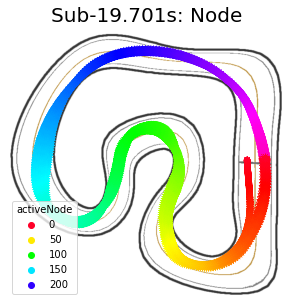

In [20]:
fig, ax = plt.subplots(figsize=(5,6))
img = Image.open(track_outline_file).copy()
img = img.transpose(method=Image.FLIP_TOP_BOTTOM)
ax.imshow(img)
ax.invert_yaxis()
ax.axis('off')
plt.title(f'Sub-{max_lap_time}s: Node', size=20)
ax = sns.scatterplot(data=df, 
                     y=y, 
                     x=x, 
                     hue='activeNode', 
                     # hue_norm=(-1.0,1.0), 
                     palette='gist_rainbow', 
                     ax=ax, marker=(8,2,0), 
                     alpha=1.0)

These take advantage of Seaborn's "hue" function to map interesting things onto trajectories. You can use almost anything as a hue, as demonstrated above with "activeNode".

Palletes:
* [Choosing Colormaps in Matplotlib](https://matplotlib.org/stable/tutorials/colors/colormaps.html)
* [Choosing color palettes (Seaborn)](https://seaborn.pydata.org/tutorial/color_palettes.html)

Markers:
* [matplotlib.markers](https://matplotlib.org/stable/api/markers_api.html)

In [21]:
## Helper function for side-by-side plots.
# Only the left legend displays, you can modify this if you want.
# The defaults don't produce particularly satisfying maps, but you do you.
def twin_colomaps(df1, x1, y1, 
                  df2, x2, y2,
                  figsize = (20,10), # (width, height)
                  marker='o', 
                  alpha=1.0, 
                  hue=None,  
                  hue_norm=None, 
                  pallette='coolwarm', 
                  legend=None):
    
    sns.set_style('white')

    fig, ax = plt.subplots(1, 2, figsize=(20, 10))

    img = Image.open(track_outline_file).copy()
    img = img.transpose(method=Image.FLIP_TOP_BOTTOM)

    ax[0].imshow(img)
    ax[0].invert_yaxis()
    ax[0].axis('off')
    ax[0].set_title(f'Sub-{max_lap_time}s: {hue.title()}', size=20)
    ax[0] = sns.scatterplot(data=df1, 
                             y=y1, 
                             x=x1, 
                             ax=ax[0], 
                             hue=hue,  
                             hue_norm=hue_norm,  
                             palette=pallette, 
                             marker=marker, 
                             alpha=alpha,)
                           # legend=False)
    ax[0].legend(title=legend);


    ax[1].imshow(img)
    ax[1].invert_yaxis()
    ax[1].axis('off')
    ax[1].set_title(f'Sub-{fast_lap_cutoff}s: {hue.title()}', size=20)
    ax[1] = sns.scatterplot(data=df2, 
                             y=y2, 
                             x=x2, 
                             ax=ax[1], 
                             hue=hue,  
                             hue_norm=hue_norm,  
                             palette=pallette, 
                             marker=marker, 
                             alpha=alpha,#)
                             legend=False)
# plt.tight_layout();

### Speed

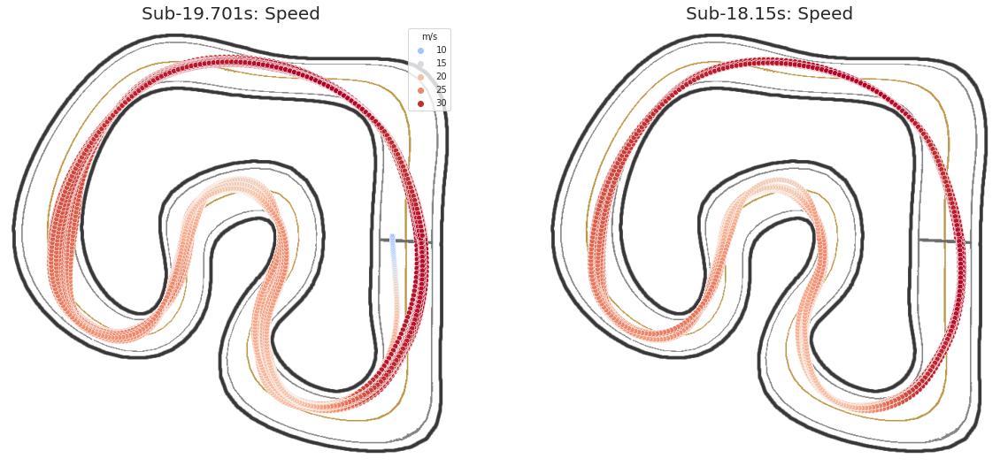

In [22]:
twin_colomaps(df, x, y, 
              df_fast, x_fast, y_fast, 
              marker='o', 
              alpha=1.0, 
              hue='speed', 
              hue_norm=(0, df['speed'].max()), 
              pallette='coolwarm', 
              legend='m/s')

### Throttle

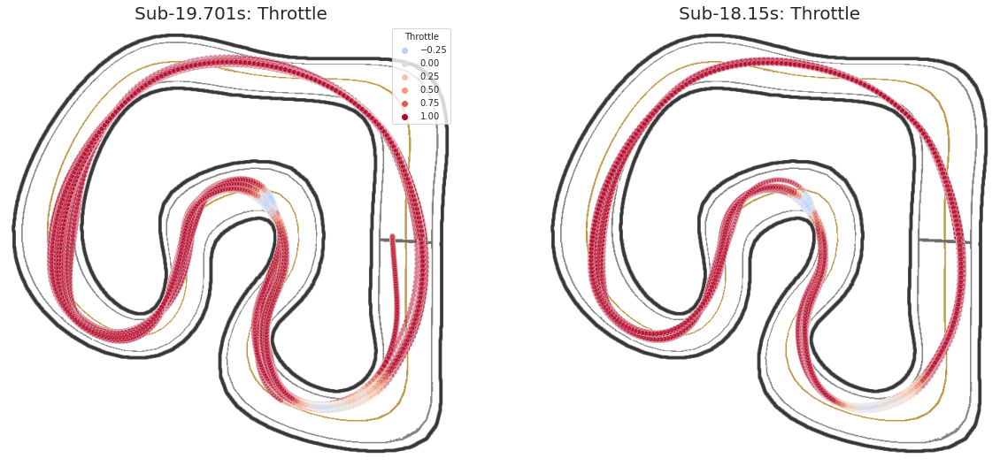

In [23]:
twin_colomaps(df, x, y, 
              df_fast, x_fast, y_fast, 
              marker='o', 
              alpha=0.5, 
              hue='throttle', 
              hue_norm=(-1.0,1.0), 
              pallette='coolwarm', 
              legend='Throttle')

### Steering

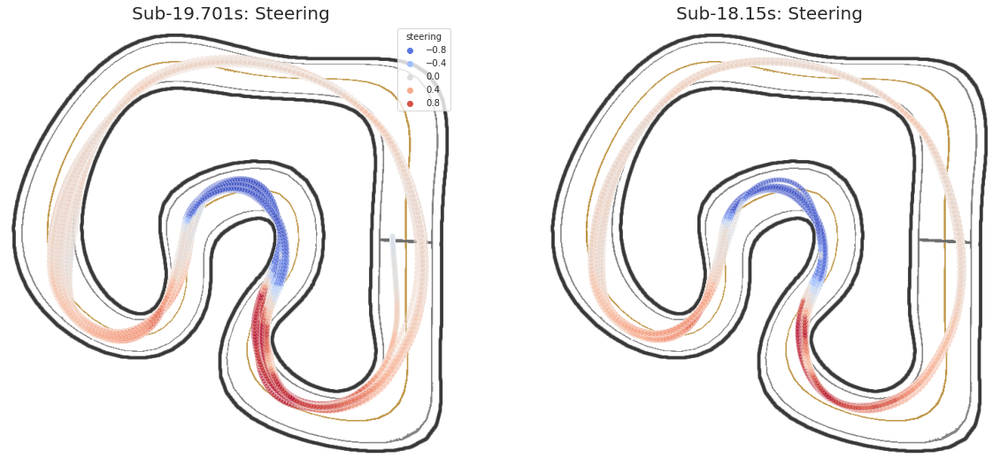

In [24]:
twin_colomaps(df, x, y, 
              df_fast, x_fast, y_fast, 
              marker='o', 
              alpha=0.5, 
              hue='steering', 
              hue_norm=(-1.0,1.0), 
              pallette='coolwarm', 
              legend='steering')


## Fastest Lap

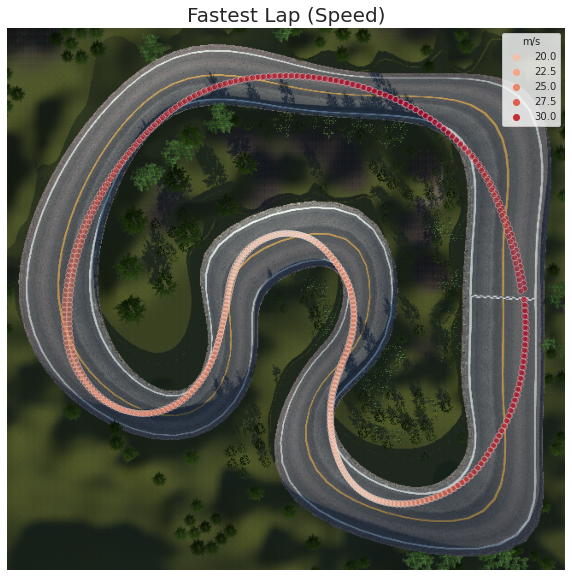

In [30]:
#
df_nodes = df_fastest.copy()

sns.set_style("white")
fig, ax = plt.subplots(figsize=(10,11))
img = Image.open(track_image_file).copy()
img = img.transpose(method=Image.FLIP_TOP_BOTTOM)
ax.imshow(img)
ax.invert_yaxis()
ax.axis('off')
plt.title(f"Fastest Lap (Speed)", size=20)
ax = sns.scatterplot(data=df_fastest, 
                     y=y_fastest, 
                     x=x_fastest, 
                     hue='speed',  
                     hue_norm=(0,df['speed'].max()), 
                     palette='coolwarm',
                     ax=ax, 
                     marker="o",
                     alpha=0.5)
ax.legend(title='m/s');

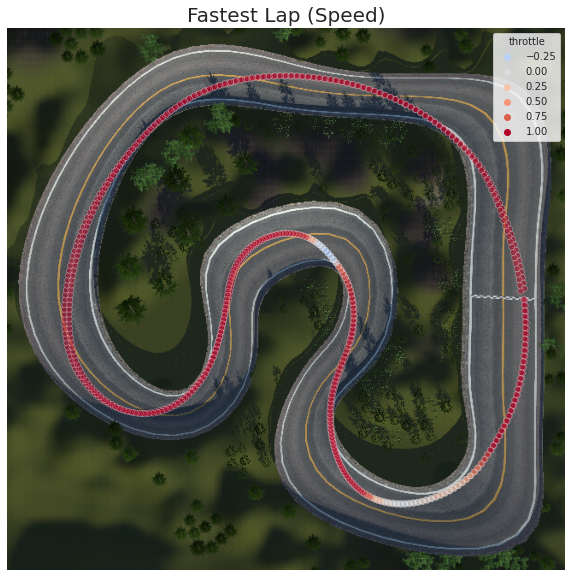

In [31]:
sns.set_style("white")
fig, ax = plt.subplots(figsize=(10,11))
img = Image.open(track_image_file).copy()
img = img.transpose(method=Image.FLIP_TOP_BOTTOM)
ax.imshow(img)
ax.invert_yaxis()
ax.axis('off')
plt.title(f"Fastest Lap (Speed)", size=20)
ax = sns.scatterplot(data=df_fastest, 
                     y=y_fastest, 
                     x=x_fastest, 
                     hue='throttle', 
                     hue_norm=(-1.0,1.0),
                     palette='coolwarm', 
                     ax=ax, 
                     # marker="O",
                     # marker=(8,2,0), 
                     alpha=0.5)

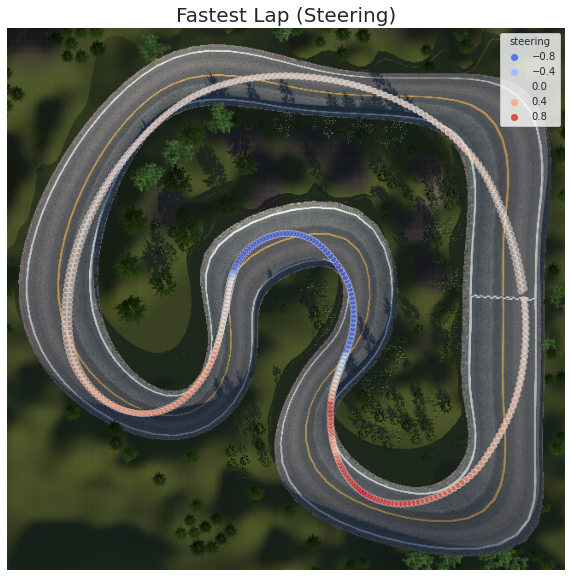

In [32]:
sns.set_style("white")
fig, ax = plt.subplots(figsize=(10,11))
img = Image.open(track_image_file).copy()
img = img.transpose(method=Image.FLIP_TOP_BOTTOM)
ax.imshow(img)
ax.invert_yaxis()
ax.axis('off')
plt.title(f"Fastest Lap (Steering)", size=20)
ax = sns.scatterplot(data=df_fastest, 
                     y=y_fastest, 
                     x=x_fastest, 
                     hue='steering', 
                     hue_norm=(-1.0,1.0),
                     palette='coolwarm', 
                     ax=ax, 
                     # marker="O",
                     # marker=(8,2,0), 
                     alpha=0.5)

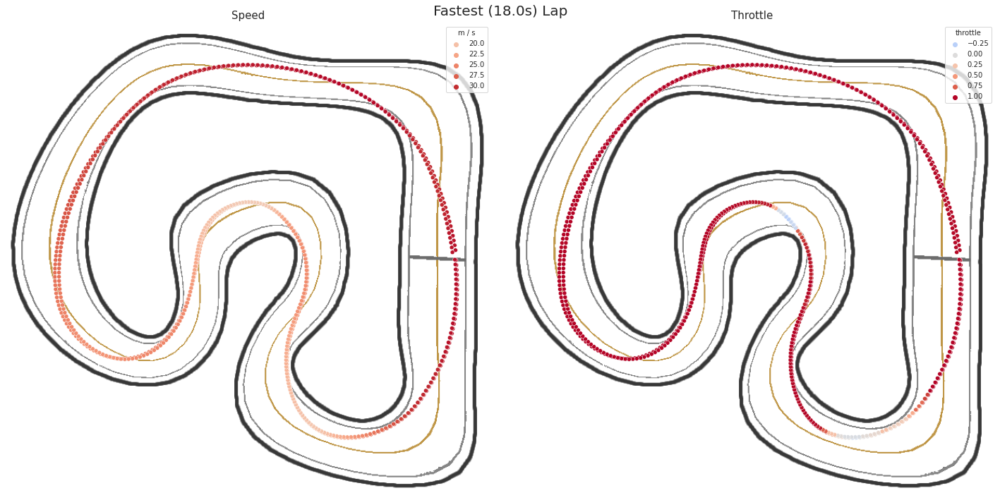

In [28]:
sns.set_style('white')
marker = "o"
# marker = (8,2,0)
alpha = 1.0
palette = 'coolwarm'

fig, ax = plt.subplots(1, 2, figsize=(20, 10))

img = Image.open(track_outline_file).copy()
img = img.transpose(method=Image.FLIP_TOP_BOTTOM)

ax[0].imshow(img)
ax[0].invert_yaxis()
ax[0].axis('off')
ax[0].set_title('Speed', size=15)
ax[0] = sns.scatterplot(data=df_fastest, 
                         y=y_fastest, 
                         x=x_fastest, 
                         ax=ax[0], 
                         hue='speed',  
                         hue_norm=(0,df['speed'].max()),  
                         palette=palette, 
                         marker=marker, 
                         alpha=alpha,)
                       # legend=False)
ax[0].legend(title='m / s');


ax[1].imshow(img)
ax[1].invert_yaxis()
ax[1].axis('off')
ax[1].set_title('Throttle', size=15)
ax[1] = sns.scatterplot(data=df_fastest, 
                         y=y_fastest, 
                         x=x_fastest, 
                         ax=ax[1], 
                         hue='throttle',  
                         hue_norm=(-1.0, 1.0),  
                         palette=palette, 
                         marker=marker, 
                         alpha=alpha);
                        # legend=False)
# ax[1].legend(title='m / s');

plt.suptitle(f"Fastest ({round(df_fastest['lap_time'].unique()[0], 4)}s) Lap", size=20);
plt.tight_layout();

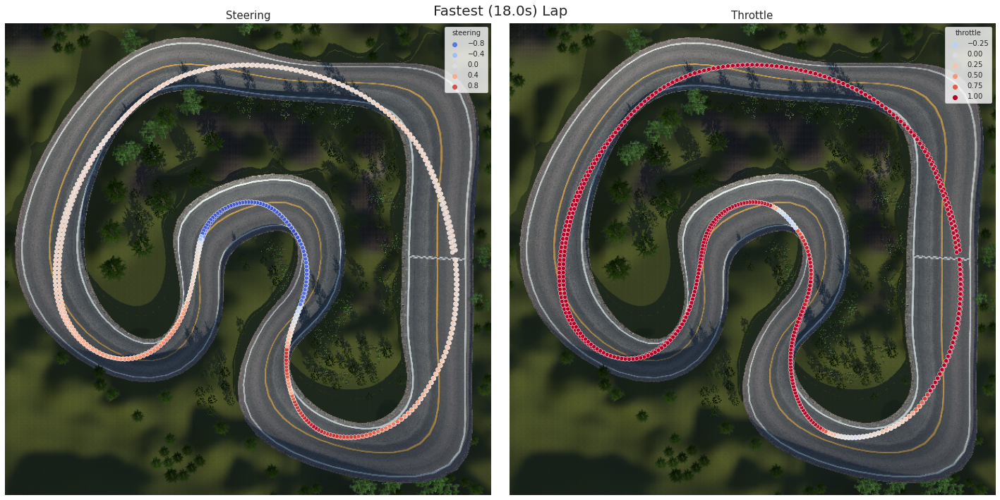

In [29]:
sns.set_style('white')
marker = "o"
# marker = (8,2,0)
alpha = 1.0
palette = 'coolwarm'

fig, ax = plt.subplots(1, 2, figsize=(20, 10))

img = Image.open(track_image_file).copy()
img = img.transpose(method=Image.FLIP_TOP_BOTTOM)

ax[0].imshow(img)
ax[0].invert_yaxis()
ax[0].axis('off')
ax[0].set_title('Steering', size=15)
ax[0] = sns.scatterplot(data=df_fastest, 
                         y=y_fastest, 
                         x=x_fastest, 
                         ax=ax[0], 
                         hue='steering',  
                         hue_norm=(-1.0,1.0),  
                         palette=palette, 
                         marker=marker, 
                         alpha=alpha,)
                       # legend=False)
ax[0].legend(title='steering');


ax[1].imshow(img)
ax[1].invert_yaxis()
ax[1].axis('off')
ax[1].set_title('Throttle', size=15)
ax[1] = sns.scatterplot(data=df_fastest, 
                         y=y_fastest, 
                         x=x_fastest, 
                         ax=ax[1], 
                         hue='throttle',  
                         hue_norm=(-1.0, 1.0),  
                         palette=palette, 
                         marker=marker, 
                         alpha=alpha, );
                        # legend=False)
ax[1].legend(title='throttle');

plt.suptitle(f"Fastest ({round(df_fastest['lap_time'].unique()[0], 4)}s) Lap", size=20);
plt.tight_layout();

## Video

The video isn't saved automatically; save it like you would any other video once it has been created.

This was largely hacked together from stackoverflow posts, and it's probably wildly suboptimal.

One lap takes a long time to encode; I wouldn't try it with any more than that unless you've got some beefy hardware.

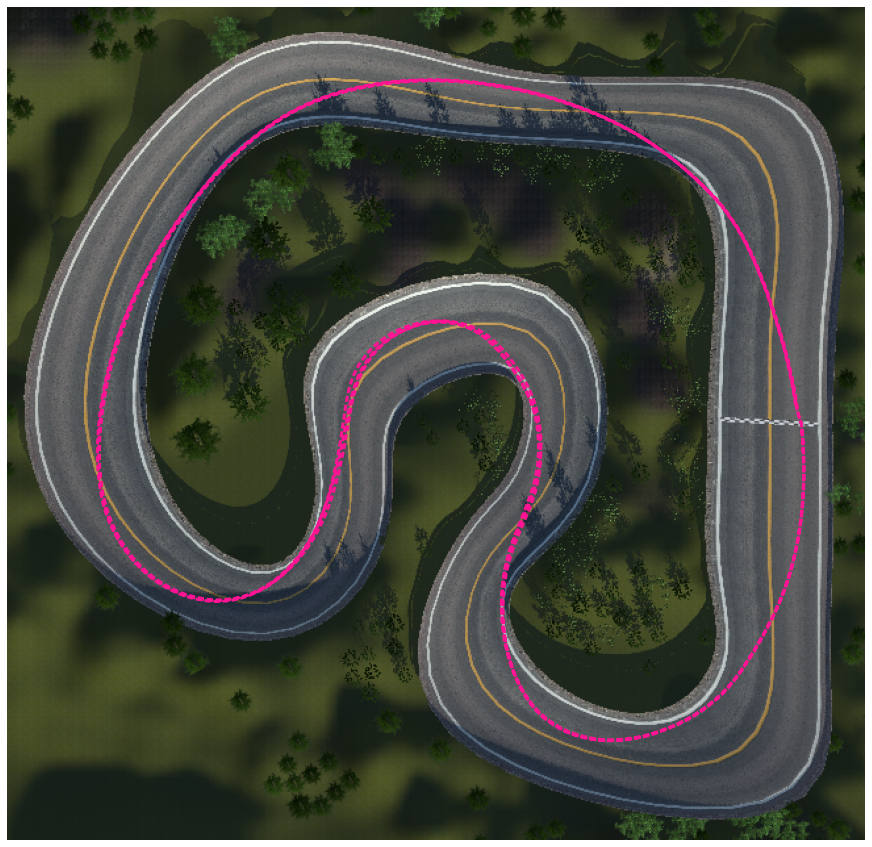

In [43]:
plt.rcParams["animation.html"] = "html5"
fig, ax = plt.subplots(figsize=(12,12), constrained_layout=True)
line, = ax.plot(x_fastest, y_fastest, color='deeppink', linewidth=3, linestyle=(0, (2,1)))
ax.axis('off')
ax.set_aspect('equal')

img = Image.open(track_image_file).copy()
# img = Image.open(track_outline_file).copy()

img = img.transpose(method=Image.FLIP_TOP_BOTTOM)

plt.imshow(img);

ax.set_ylim(img.height, 0)

def update(num, x, y, line):
    line.set_data(x[:num], y[:num])
    line.axes.axis([0, img.width, 0, img.height])
    return line,

ani = animation.FuncAnimation(fig, update, len(x_fastest), fargs=[x_fastest, y_fastest, line],
                              interval=50, blit=True, repeat=True)

ani

## Animated GIF
Below is code to generate the frames needed to produce an animated GIF. Each iteration produces a dot and a time reading.

In [ ]:
## Designate which laps to animate.
## Here, it's the fastest lap.
df_animated = df_fastest.reset_index(drop=True)

In [ ]:
## Count frames
df_animated.index.max()

In [ ]:
## Create plot data as above.
x_animated = ((df_animated['pos_x'].copy() - x_offset) * track_scale) + x_shift
y_animated = ((df_animated['pos_z'].copy() - y_offset) * track_scale) + y_shift

In [ ]:
## Directory to hold the frames. Modify as necessary.
frames_folder = f"{data_directory}/frames"
os.makedirs(frames_folder, exist_ok=True)

In [ ]:
## For display purposes, so the time count starts at 0.00
df_animated['time'] = df_animated['time'] - df_animated['time'].min()

In [ ]:
display_time = True

# Lap time display placement/size
text_x, text_y, text_size, = (50, 50, 40)
box_left, box_bottom, box_width, box_height = (50, 47, 90, 30)

# base layer image
fig, ax = plt.subplots(figsize=(15,15))
img = Image.open(track_image_file).copy()
img = img.transpose(method=Image.FLIP_TOP_BOTTOM)
ax.imshow(img)
ax.invert_yaxis()
ax.set_ylim(bottom=0,top=img.height)
ax.set_xlim(xmin=0, xmax=img.width)
ax.axis('off')
plt.savefig(f'{frames_folder}/base.png', bbox_inches='tight', pad_inches=0.0, transparent=False)

# draw dots on mostly-transparent PNGs
for i in range(df_animated.index.max() + 1):
    ax.clear
    fig, ax = plt.subplots(figsize=(15,15))
    ax.invert_yaxis()
    ax.set_ylim(bottom=0,top=img.height)
    ax.set_xlim(xmin=0, xmax=img.width)
    ax.axis('off')
    ax = sns.scatterplot(data=df_animated,
                         y=y_animated[i:i+1],
                         x=x_animated[i:i+1],
                         hue='speed', 
                         hue_norm=(0,df_animated['speed'].max()),
                         palette='coolwarm', 
                         ax=ax, 
                         marker='o',
                         s=75,
                         alpha=0.9,
                         legend=(i==0), # just need to print legend once
                         edgecolor="none")
    
    if display_time:
        # Draw black rectangle for lap time
        rect = plt.Rectangle((box_left, box_bottom), 
                             box_width, 
                             box_height,
                             color="black", 
                             alpha=1.0)
        ax.add_patch(rect)
        # Add white text
        # It prints a pixel lower on some frames for reasons I can't suss out.
        # I went through and fixed the individual frames later in GIMP.
        time_string = f"{df_animated.iloc[i]['time']:.2f}"
        if df_animated.iloc[i]['time'] < 10.0:
            time_string = f'0{time_string}' # there are better ways to do this
        plt.text(x=text_x, y=text_y, s=time_string, color='white', fontsize=text_size)
    
    # Save frame
    plt.savefig(f'{frames_folder}/f_{str(i).zfill(3)}', bbox_inches='tight', pad_inches=0.0, transparent=True)
    plt.close()

Now take the frames and use them in your favorite gif builder